In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.io as pio
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px

# Reading Data

In [2]:
df = pd.read_csv('owid-covid-data.csv')
columns = df.columns
columns_contain_million_inf = [column for column in columns if 'million' in column]
df = df.drop(columns_contain_million_inf, axis=1)

# Part 1:‌ Covid-19 in Iran

## Question 1

In [3]:
df['date'] = pd.to_datetime(df['date'])
df_Iran = df[df['location'] == 'Iran']

new_df = df_Iran[['new_cases', 'new_deaths', 'new_vaccinations_smoothed', 'date', 'stringency_index']]
new_df = new_df.resample('W', on='date').sum()
new_df['date'] = new_df.index

fig = make_subplots(rows=3, cols=1, subplot_titles=('New Cases', 'New Deaths', 'New Vaccinations'))


fig.append_trace(go.Scatter(
    x=list(new_df['date']),
    y=list(new_df['new_cases']),
), row=1, col=1)


fig.append_trace(go.Scatter(
    x=list(new_df['date']),
    y=list(new_df['new_deaths']),
), row=2, col=1)


fig.append_trace(go.Scatter(
    x=list(new_df['date']),
    y=list(new_df['new_vaccinations_smoothed']),
), row=3, col=1)


fig.update_layout(height=600, width=600, title_text="covid-19 cases vs deaths vs vaccines", showlegend=False)
fig.update_xaxes(calendar='jalali', dtick='M1', tickformat="%b\n\n\n%Y", tickangle=45, showgrid=True,
 gridcolor='#1CFFCE', gridwidth=1)
fig.update_yaxes(showgrid=False)
fig.show()

برای رسم نمودار تعداد واکسیناسیون با توجه به خالی بودن اکثر سطرهای داده برای ایران از ستون واکسیناسیون هموار شده استفاده شده است. <br>
همان طور که مشاهده میشود تعداد میزان مرگ و میر با تعداد کیس های کرونا رابطه شدیدی دارد. هم چنین با یک فاصله زمانی چند هفته ای پیک های مرگ و میر نسبت به پیک شروع کیس ها شروع و پایان یافته است. <br>
واکسیناسیون در چند مقطع زمانی شدت گرفته است. هم چنین چون در آخرین پیک واکسیناسیون اکثریت شروع شده است هنوز نمیتوان از روی نمودار اثر آن را
بر کاهش موارد مرگ و میر و نمونه ها بررسی کرد.

## Question 2

In [4]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=list(df_Iran.date), y=list(df_Iran.stringency_index)))
fig.update_layout(title_text="stringency trend in Iran")

fig.update_layout(
    xaxis=dict(
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.update_xaxes(calendar='jalali', dtick='M1', tickformat="%b\n\n\n%Y", tickangle=45)

fig.show()

سخت گیری ابتدای شروع کرونا به شدت افزایش یافته است. اما بعد از عبور از پیک اول سخت گیری به میزان قابل توجهی کاهش یافته است.<br>
که چون بعد از آن پیک های شدیدتری برای بیماری رخ داده است هم به حالت قبل بازگشته است و هم در سری پیک های دوم و سوم چهارم افزایش یافته است.<br>
بعد از پیک چهارم به میزان کمی سخت گیری کاهش یافته است اما با رخداد شدیدترین موج یعنی موج پنجم سخت گیری بعد و قبل از آن تغییر چندانی نکرده است.<br>

## Question 3

In [5]:
fig = make_subplots(rows=2, cols=1, subplot_titles=('New Cases', 'Stringency Index'))


fig.append_trace(go.Scatter(
    x=list(df_Iran['date']),
    y=list(df_Iran['new_cases'].rolling(14).mean()),
), row=1, col=1)


fig.append_trace(go.Scatter(
    x=list(df_Iran['date']),
    y=list(df_Iran['stringency_index'].rolling(14).mean()),
), row=2, col=1)


fig.update_layout(height=600, width=600, title_text="covid-19 cases vs stringency index", showlegend=False)
fig.update_xaxes(calendar='jalali', dtick='M1', tickformat="%b\n\n\n%Y", tickangle=45, showgrid=True)
fig.show()


به طور کلی در داده ها ایران نمیتوان رابطه خاصی برای میزان سخت گیری و شروع پیک ها در نظر گرفت. <br>
اما برای تعدادی پیک ها از جمله پیک سوم و آخر میتوان نتیجه گرفت چون سخت گیری به میزان قابل توجهی نسبت به قبل کاهش یافته موجب شروع پیک جدید شده باشد. <br>
گرچه در مورد پیک چهارم با این که سخت گیری کاهش نیافته ولی پیک رخ داده است و هنگام رخ دادن پیک سخت گیری افزایش یافته تا از پیشروی آن جلوگیری شود<br>
یک دلیل طولانی شدن پیک آخر را میتوان در عدم افزایش سخت گیری ها بعد از رخ دادن پیک در نظر گرفت که در پیک های قبلی افزایش سخت گیری منجر به تموم شدن سریع تر پیک شده است.

## Question 4

In [6]:
import plotly.io as pio
pio.renderers.default = "vscode"

countries = ['United States', 'Turkey', 'Iran', 'Japan', 'Germany']

new_df = df[df['location'].isin(countries)]
new_df = new_df[new_df['date'] >= '2020-11-21']
new_df['rolling'] = new_df['new_vaccinations_smoothed'].rolling(14).mean()
fig = px.line(new_df, x="date", y="rolling", color='location')
fig.update_layout(height=600, width=600, title_text="covid-19 vaccines comparisons", showlegend=True)
fig.update_xaxes(calendar='jalali', dtick='M1', tickformat="%b\n\n\n%Y", tickangle=45)
fig.show()


برای مقایسه سرعت واکسیناسیون نمودار تعداد واکسیناسیون پنج کشور آلمان، ایران، ژاپن، ترکیه و آمریکا رسم شده است. <br>
همان طور که مشاهده میشود آمریکا اولین کشوری بوده که واکسیناسیون را شروع کرده و با سرعت زیادی این کار را انجام داده است. <br>
ایران نیز آخرین کشوری بوده که واکسیناسیون آن رشد داشته است. <br>
سه کشور آمریکا، ژاپن و ترکیه به نسبت دو کشور آلمان و ایران سرعت افزایش تعداد واکسن های آن ها بسیار بیشتر بوده است و در زمان کمتری توانسته اند به حداکثر میزان واکسیناسیون خود برسند.<br>
واکسیناسیون کشور آمریکا بر خلاف بقیه کشورها بعد از مدتی که سرعت آن کم شده است دوباره افزایشی شده است که میتواند به خاطر تزریق دز سوم واکسن در این کشور باشد که شدت گرفته است.

# Part 2: Countries Comparison

## Question 1

<AxesSubplot:>

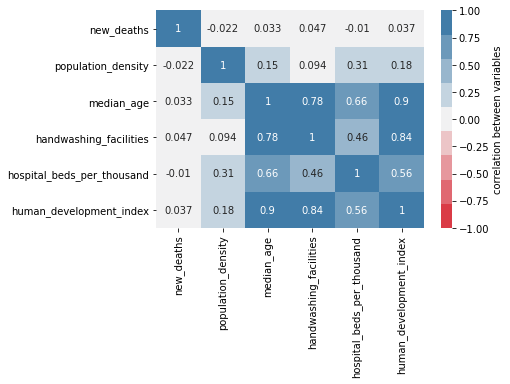

In [7]:
columns = ['new_deaths', 'population_density', 'median_age', 'handwashing_facilities',
 'hospital_beds_per_thousand', 'human_development_index']

new_df = df[columns]
cmap = sns.diverging_palette(10, 240, n=9)
sns.heatmap(new_df.corr(), vmin=-1, vmax=1, annot=True, cmap=cmap, cbar_kws={'label': 'correlation between variables'})

با این که بین متغیرهای معرفی شده رابطه کوریلیشن مثبتی وجود دارد. <br>
به عنوان مثال وجود امکانات بهداشتی با تعداد تخت بیمارستان و شاخص پیشرفت و امید به زندگی رابطه مثبت و شدیدی دارند. <br>
اما متغیرها به میزان مرگ و میر کرونا رابطه خطی کوریلیشن معناداری از نظر آماری ندارند. <br>
البته این به این معنا نیست که کلا رابطه ندارند و شاید رابطه های مرتبه های بالاتر و غیر خطی داشته باشند.<br>

## Question 2

Text(0, 0.5, 'percentage of total world population')

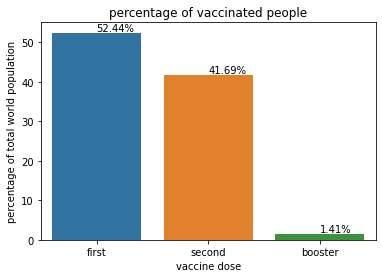

In [8]:
import warnings
warnings.filterwarnings('ignore')

new_df = df[['people_vaccinated', 'people_fully_vaccinated', 'total_boosters', 'location', 'population']]
result = new_df.dropna().groupby('location').last().sum(axis=0)
result = (result/result['population']) * 100
result = result.round(2)

del result['population']

x = ['first', 'second', 'booster']
y = list(result)

ax = sns.barplot(x, y)
for i, v in enumerate(y):
    ax.text(i, v+0.5, str(v) + '%', color='black')

plt.title('percentage of vaccinated people')
plt.xlabel('vaccine dose')
plt.ylabel('percentage of total world population')

همان طور که مشاهده میشود تقریبا ۵۲ درصد دوز اول، ۴۲ درصد دوز دوم و ۱.۵ درصد دوز سوم را دریافت کرده اند.

## Question 3

Text(0.5, 0, 'amalkard by percentage')

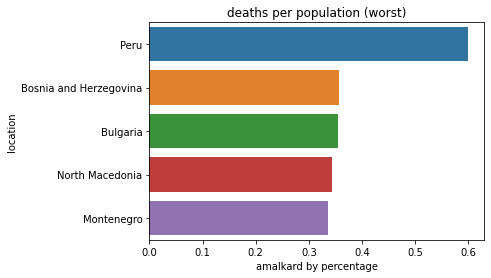

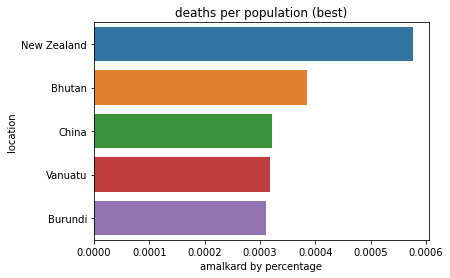

In [9]:
new_df = df[['total_deaths', 'location', 'population']]
result = new_df.dropna().groupby('location').last()
result['amalkard'] = (result['total_deaths']/result['population']) * 100
result = result.sort_values(by='amalkard', ascending=False)


sns.barplot(result[:5]['amalkard'], result.index[:5], orient='h')
plt.title('deaths per population (worst)')
plt.xlabel('amalkard by percentage')


plt.figure()
sns.barplot(result[-5:]['amalkard'], result.index[-5:], orient='h')
plt.title('deaths per population (best)')
plt.xlabel('amalkard by percentage')

همان طور که مشاهده میشود کشورهای پرو، بوسنی، بلغارستان، مقدونیه بدترین عملکرد را داشته اند و بین سه دهم تا شش دهم درصد میزان مرگ و میر آن ها نسبت به جمعیتشان بوده است. <br>
بهترین کشورها از نظر عملکرد نیوزیلند، بوتان، چین، فانواتو و بوروندی بوده اند. <br>
البته از نتایج برمی آید که معیار مرگ و میر به میزان جمعیت معیار خوبی برای مقایسه عملکرد کشورها در بیماری کرونا نیست.بلکه معیارهای دیگری علاوه بر جمعیت را باید با مرگ و میر مقایسه کرد.

## Question 4

Text(0.5, 0, 'total vaccinations')

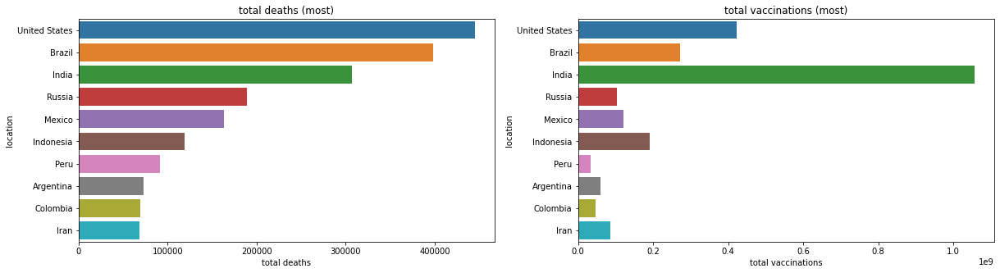

In [10]:
new_df = df[['new_deaths', 'new_vaccinations_smoothed', 'location']]
worlds = ['World', 'Asia', 'Upper middle income', 'Lower middle income', 'High income', 'Europe',
          'South America', 'North America', 'European Union', 'Africa', 'Low income']

new_df = new_df[~new_df['location'].isin(worlds)]
result = new_df.dropna().groupby('location').sum().sort_values(by=['new_deaths', 'new_vaccinations_smoothed'], ascending=False)

fig, axes = plt.subplots(1, 2, figsize=(20, 5))
n = 10
sns.barplot(result[0:n]['new_deaths'], result.index[:n], orient='h', ax=axes[0])
axes[0].set_title('total deaths (most)')
axes[0].set_xlabel('total deaths')



sns.barplot(result[:n]['new_vaccinations_smoothed'], result.index[:n], orient='h', ax=axes[1])
axes[1].set_title('total vaccinations (most)')
axes[1].set_xlabel('total vaccinations')

برای مقایسه کشورها را بر اساس ابتدا تعداد مرگ و میر و سپس بر اساس تعداد واکسن تزریق شده مرتب میکنیم. <br>
با این کار میتوانیم کشورهایی که مرگ و میر بالایی داشته اند و واکسیناسیون حداکثری در آن ها انجام شده را برای تحلیل تاثیر واکسن بر مرگ و میر استفاده کنیم.<br>
در نمودار بالا نتیجه برای تعداد مرگ و میر در سمت چپ و تعداد واکسن در سمت راست آورده شده است.

حال در ادامه نمودار مرگ و میر و واکسن این ۱۰ کشور را رسم میکنیم.

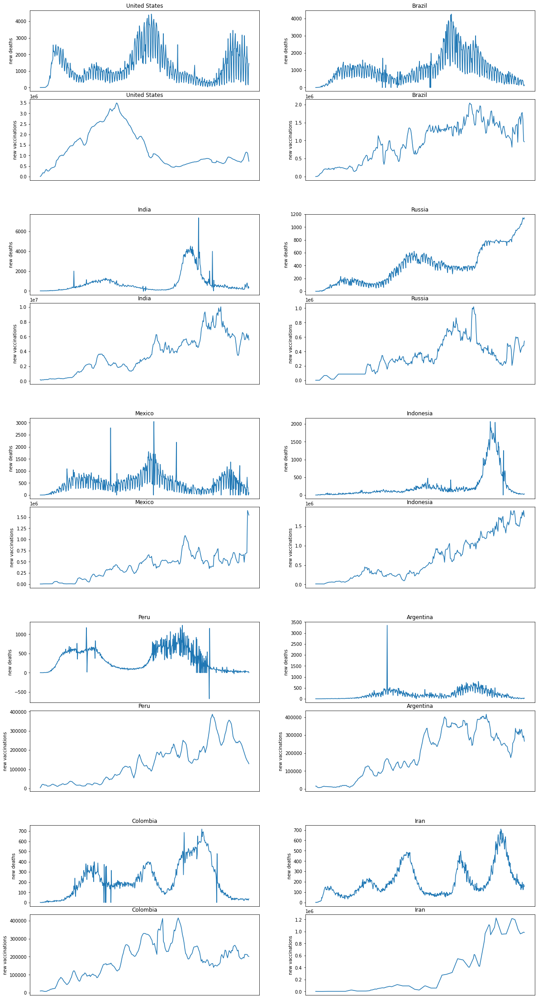

In [11]:
import matplotlib.gridspec as gridspec

selected_countries = list(result.index[:n])

inner_size = 2
fig = plt.figure(figsize=(20, 40))
outer = gridspec.GridSpec(int(n/2), inner_size, wspace=0.2, hspace=0.2)

for i in range(n):
    inner = gridspec.GridSpecFromSubplotSpec(2, 1,
                    subplot_spec=outer[i], wspace=0.1, hspace=0.1)

    current_data = df[df['location'] == selected_countries[i]]
    ax = plt.Subplot(fig, inner[0])
    ax.plot(current_data['new_deaths'])
    ax.set_title(selected_countries[i])
    ax.set_ylabel('new deaths')
    ax.set_xlabel('')
    ax.set_xticks([])
    fig.add_subplot(ax)
    
    ax = plt.Subplot(fig, inner[1])
    ax.plot(current_data['new_vaccinations_smoothed'])
    ax.set_title(selected_countries[i])
    ax.set_ylabel('new vaccinations')
    ax.set_xlabel('')
    ax.set_xticks([])

    fig.add_subplot(ax)

fig.show()

برای ۱۰ کشور به دست آمده نمودار تعداد مرگ و میر و واکسیناسیون در بالا رسم شده است. <br>
طبق نمودارهای بالا لزوما واکسیناسیون در این کشورها به معنای پایان یافتن مرگ و میر نبوده ولی به جز روسیه به وضوح همه این ۱۰ کشور میزان مرگ و میرشان نسبت به پیک های قبلی کاهش یافته است.

## Question 5

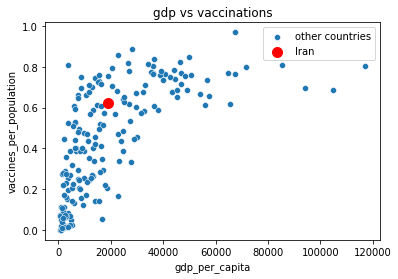

In [12]:
new_df = df[['people_vaccinated', 'location', 'gdp_per_capita', 'population']]
new_df = new_df.dropna()
result = new_df.groupby('location').last()
result['vaccines_per_population'] = result['people_vaccinated'] / result['population']


Iran = result.loc['Iran']
fig = sns.scatterplot(data = result, x = "gdp_per_capita", y = "vaccines_per_population", label='other countries')
plt.scatter(x=Iran['gdp_per_capita'], y=Iran['vaccines_per_population'], color='red', s=100, label='Iran')
plt.legend()
plt.title('gdp vs vaccinations')
plt.show()

برای رسم نمودار وضعیت اقتصادی با نه فقط تعداد واکسیناسیون بلکه نسبت واکسیناسیون به جمعیت مقایسه شده است تا رابطه آن بهتر مشخص شود. <br>
همان طور که مشاهده میشود تعدادی کشورها که وضعیت اقتصادی آن ها از حدی بیشتر است توانسته اند به میزان بالای ۶۰ درصد افراد خود را واکسینه کنند. <br>
البته کشورهایی بوده اند که با وضعیت اقتصادی پایین توانسته باشند اکثریت افراد را وکسیته کنند. <br>
اما اگر وضعیت اقتصادی کشوری بالا بوده قطعا اکثریت افراد خود را واکسینه کرده است. <br>
هم چنین ایران با رنگ قرمز در نمودار مشخص شده است که جز کشورهای به نسبت پایین درآمد اقتصادی است که توانسته واکسیناسیون خوبی انجام دهد.

## Question 6

In [13]:
import datetime
from datetime import date
from dateutil.relativedelta import relativedelta

countries_codes = pd.read_csv('countries_codes_and_coordinates.csv')

countries_codes.rename(columns={'Country': 'location'}, inplace=True)
new_df = df.merge(countries_codes, on='location')

today = datetime.datetime.now()
six_months = date.today() - relativedelta(months=+6)

six_months = six_months.strftime('%Y-%m-%d')

new_df = new_df[new_df['date'] >= six_months]

new_df = new_df[['new_deaths', 'iso_code', 'location', 'population']]

new_df['new_deaths_cumsum'] = new_df.groupby('location')['new_deaths'].cumsum()
new_df['deaths_per_population'] = (new_df['new_deaths_cumsum']/new_df['population']) * 100

fig = px.choropleth(new_df, locations="iso_code",
                    color="deaths_per_population",
                    color_continuous_scale=px.colors.sequential.Oranges, 
                    title='covid-19 deaths per population')
fig.show()

این نمودار از کد سه حرفی کشورها برای مشخص شدن کشورها استفاده میکند. برای این کار داده ی جدیدی دانلود شود که شامل این کد سه حرفی و نام کشورها بود و با داده های اصلی ادغام شد. <br>
همان طور که مشاهده میشود در ۶ ماه اخیر کشورهای روسیه و آمریکای جنوبی و آفریقای جنوبی بیشترین میزان مرگ و میر نسبت به جمعیت را داشته اند. <br>

## Question 7

In [14]:
new_df = df.merge(countries_codes, on='location')
new_df = new_df[['people_vaccinated', 'iso_code', 'location', 'population']]
result = new_df.groupby('location').last()

fig = px.choropleth(new_df, locations="iso_code",
                    color="people_vaccinated",
                    color_continuous_scale=px.colors.sequential.thermal, 
                    hover_data=["population"],
                    title='covid-19 vaccinations')
fig.show()

همان طور که مشاهده میشود تعداد چین و آمریکا و برزیل و روسیه که جمعیت بالایی دارند جز کشورهای با بیشترین میزان واکسیناسیون بوده اند.

## Question 8

برای سوال ۷ که هدف نشان دادن تعداد واکسیناسیون است چون واریانس اعداد بسیار بالا است بهتر است از اسکترپلات استفاده شود زیرا سایز را بهتر میتواند تا رنگ روی نقشه نشان دهد و خواناتر است. <br>
اما برای سوال ۶ چون نسبت را نشان میدهیم و عدد عددی بین صفر و یک است تا حدودی میتوان از هر دو نوع نمودار استفاده کرد.
استفاده از رنگ زمان هایی بهتر است که اعداد به صورت یونیفورم در یک بازه ای پخش شده باشند تا تفاوت آن ها بهتر مشخص باشد. و هم چنین داده پرت نداشته باشیم. <br>
اما زمان هایی که میخواهیم سایز را نشان دهیم اسکترپلات بسیار برای مخاطب خواناست.



# Part 3: Conclusion

## Question 1

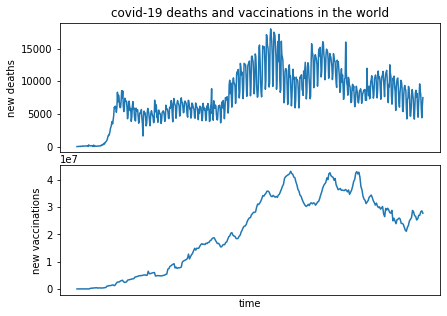

In [15]:
worlds = ['World']

n = len(worlds)

inner_size = 2
fig = plt.figure(figsize=(15, 5))
outer = gridspec.GridSpec(1, inner_size, wspace=0.2, hspace=0.2)

for i in range(n):
    inner = gridspec.GridSpecFromSubplotSpec(2, 1,
                    subplot_spec=outer[i], wspace=0.1, hspace=0.1)

    current_data = df[df['location'] == worlds[i]]
    ax = plt.Subplot(fig, inner[0])
    ax.plot(current_data['new_deaths'])
    ax.set_title('covid-19 deaths and vaccinations in the world')
    ax.set_ylabel('new deaths')
    ax.set_xlabel('')
    ax.set_xticks([])
    fig.add_subplot(ax)
    
    ax = plt.Subplot(fig, inner[1])
    ax.plot(current_data['new_vaccinations_smoothed'])
    ax.set_title('')
    ax.set_ylabel('new vaccinations')
    ax.set_xlabel('time')
    ax.set_xticks([])

    fig.add_subplot(ax)

fig.show()

نمودار مرگ و میر و واکسیناسیون برای کل جهان در بالا کشیده شده است. 
همان طور که مشاهده میشود زمانی که واکسیناسیون به حداکثر میزان خود در یک روز رسیده است از آن به بعد مرگ و میر نسبت به قبل کاهش یافته است. <br>
البته احتمالا سرعت واکسیناسیون و جمعیت در میزان مرگ و میرهای بعدی تاثیر گذار بوده است. <br>
پس باید این دو مورد به تفکیک مناطق مختلف بررسی شود تا تحلیل دقیق تری داشته باشیم. <br>

بیست کشور با بیشترین مرگ و میر در جهان را انتخاب میکنیم و سپس تعداد بر اساس نسبت تعداد واکسیناسیون به جمعیتشان آن ها را مرتب میکنیم. <br>
سپس برای هر کدام میزان حداکثر مرگ و میر را قبل و بعد از شروع واکسیناسیون بررسی میکنیم. <br>
اگر واکسیناسیون تاثبر گذار باشد انتظار میرود ۱۰ کشور اول میزان بیشترین میزان مرگ و میرشان قبل و بعد از شروع تزریق واکسن کاهش قابل توجه تری داشته باشد.

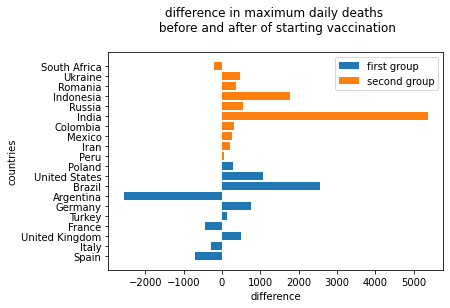

In [16]:
new_df = df[['new_deaths', 'new_vaccinations_smoothed', 'location', 'population']]
worlds = ['World', 'Asia', 'Upper middle income', 'Lower middle income', 'High income', 'Europe',
          'South America', 'North America', 'European Union', 'Africa', 'Low income']

n = 20 
new_df = new_df[~new_df['location'].isin(worlds)]
most_deaths_countries = list(new_df.dropna().groupby('location').sum().sort_values(by=['new_deaths'], ascending=False).index[:n])

new_df = new_df[new_df['location'].isin(most_deaths_countries)]

new_df['vac_per_pop'] = new_df['new_vaccinations_smoothed'] / new_df['population']
most_vac_per_pop_countries = list(new_df.groupby('location').sum()['vac_per_pop'].sort_values(ascending=False).index)

first_group_countries = most_vac_per_pop_countries[:int(n/2)]
second_group_countries = most_vac_per_pop_countries[int(n/2):]

first_group = []
for first_group_country in first_group_countries:
    current_df = new_df[new_df['location'] == first_group_country]
    first_valid_index = current_df['new_vaccinations_smoothed'].first_valid_index()
    before = current_df.loc[:first_valid_index]['new_deaths'].max()
    after = current_df.loc[first_valid_index:]['new_deaths'].max()
    
    first_group.append((before, after))


second_group = []
for second_group_country in second_group_countries:
    current_df = new_df[new_df['location'] == second_group_country]
    first_valid_index = current_df['new_vaccinations_smoothed'].first_valid_index()
    before = current_df.loc[:first_valid_index]['new_deaths'].max()
    after = current_df.loc[first_valid_index:]['new_deaths'].max()
    
    second_group.append((before, after))

# create dataframe of first group second group in one dataframe
first_group_df = pd.DataFrame(first_group, columns=['before', 'after'])
first_group_df['location'] = first_group_countries
first_group_df['type'] = ['first_group' for _ in range(len(first_group))]
first_group_df['difference'] = first_group_df['after'] - first_group_df['before']

second_group_df = pd.DataFrame(second_group, columns=['before', 'after'])
second_group_df['location'] = second_group_countries
second_group_df['type'] = ['second_group' for _ in range(len(second_group))]
second_group_df['difference'] = second_group_df['after'] - second_group_df['before']

plt.barh(first_group_df['location'], first_group_df['difference'], label='first group')
plt.barh(second_group_df['location'], second_group_df['difference'], label='second group')
plt.legend()
plt.title('difference in maximum daily deaths \n before and after of starting vaccination\n')
plt.xlabel('difference')
plt.ylabel('countries');

همان طور که مشاهده میشود کشورهای گروه اول که با رنگ آبی نمایش داده شده اند چون میزان واکسیناسیون به جمعیت آن ها بیشتر بوده است پس میزان بیشترین مرگ و میرشان بعد از شروع واکسیناسیون کاهش قابل توجه تری نسبت به گروه دوم که با رنگ نارنجی مشخص شده است داشته است.

## Question 2

با توجه به این که واکسیناسیون در کشورهای دیگر موجب جلوگیری از پیک های بعدی لزوما نشده است (البته میزان آن کاهش یافته است)
پس بدون توجه به واکسیناسیون بر اساس داده های خود کشور ایران بر اساس موارد بیماری و مرگ و میر سعی میکنیم موج بعدی را پیش بینی کنیم.


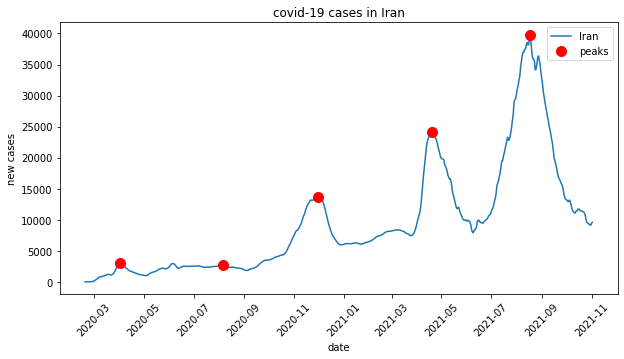

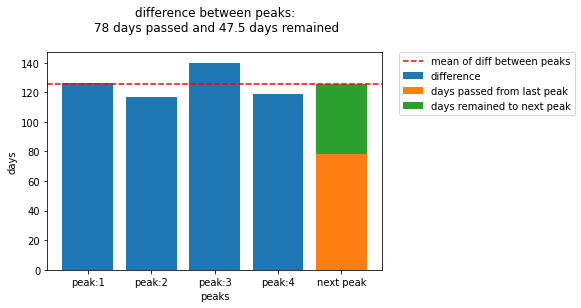

In [17]:
from scipy.signal import find_peaks

new_df = df_Iran.reset_index()
new_df = new_df[~new_df['new_cases'].isna()]
plt.figure(figsize=(10, 5))
new_df['smoothed_cases'] = new_df['new_cases'].rolling(7).mean().fillna(0)
plt.plot(new_df['date'], new_df['smoothed_cases'], label='Iran')
plt.xticks(rotation=45);
plt.xlabel('date');
plt.ylabel('new cases');
plt.title('covid-19 cases in Iran');

iran_cases = new_df['smoothed_cases'].values
peaks, _ = find_peaks(iran_cases, distance=90)

plt.plot(new_df.iloc[peaks]['date'], new_df.iloc[peaks]['smoothed_cases'], 'o', color='Red', markersize=10, label='peaks')
plt.legend();

plt.figure()

difference = np.diff(peaks)


plt.bar([f'peak:{i+1}' for i in range(len(difference))], difference, label='difference')
next_peak = len(new_df) - peaks[-1]
mean_difference = np.mean(difference)
plt.bar(['next peak'], [next_peak], label='days passed from last peak')
plt.bar(['next peak'], [mean_difference - next_peak], bottom=[next_peak], label='days remained to next peak')
plt.title(f'difference between peaks:\n {next_peak} days passed and {mean_difference - next_peak} days remained\n')

plt.axhline(y=mean_difference, color='r', linestyle='--', label='mean of diff between peaks')

plt.xlabel('peaks')
plt.ylabel('days')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

پیک های موج در بالا مشخص شده است و فرض شده است فاصله بین دو پیک حتما بیشتر از ۹۰ روز باشد. <br>
با توجه به فاصله بین پیک ها از پیک آخر ۷۸ روز گذشته است و تا میانگین فاصله بین پیک ها ۴۷.۵ روز مانده است.